# U-Net Model

# Import All Necessary Libraries and Create File Paths

In [1]:
import os
import sys
import pandas as pd
import numpy as np
import random

# Plotting
import matplotlib.pyplot as plt

# Modelling CNN|
import tensorflow as tf
import tensorflow_addons as tfa
import glob
import math
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split
import albumentations as A
from tqdm import tqdm
import math

In [2]:
# folder path or file path constants that will be used in this project
# Root Directory (between 'F:' or 'D:'' depends on the external drive)
ROOT = "D:"

# Folder inside D:\\wildfire-sumatera-dataset
WILDFIRE_SUMATERA_DATASET_FOLDER_PATH = f"{ROOT}\\wildfire-sumatera-dataset"


# Folders and metadatas inside D:\\wildfire-sumatera-dataset
WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH        = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\wildfire-sumatera-geotiff"
WILDFIRE_SUMATERA_IMAGE_FOLDER_PATH           = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\wildfire-sumatera-image"
WILDFIRE_SUMATERA_IMAGE_MASK_FOLDER_PATH      = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\wildfire-sumatera-image-mask"
WILDFIRE_SUMATERA_IMAGE_MASK_TFRECORD_PATH      = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\wildfire-sumatera-image-mask-tfrecords"

# Files (.csv) and metadatas inside D:\\wildfire-sumatera-dataset
METADATA_LANDSAT_8_FILE_PATH  = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\metadata_landsat_8.csv"
METADATA_SENTINEL_2_FILE_PATH = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\metadata_sentinel_2.csv"

# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff
SENTINEL_2_GEOTIFF_FOLDER_PATH = f"{WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH}\\sentinel-2"
LANDSAT_8_GEOTIFF_FOLDER_PATH  = f"{WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH}\\landsat-8"

# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-image
SENTINEL_2_IMAGE_FOLDER_PATH = f"{WILDFIRE_SUMATERA_IMAGE_FOLDER_PATH}\\sentinel-2"
LANDSAT_8_IMAGE_FOLDER_PATH  = f"{WILDFIRE_SUMATERA_IMAGE_FOLDER_PATH}\\landsat-8"

# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8
LANDSAT_8_PREFIRE_GEOTIFF_FOLDER_PATH  = f"{LANDSAT_8_GEOTIFF_FOLDER_PATH}\\prefire"
LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH = f"{LANDSAT_8_GEOTIFF_FOLDER_PATH}\\postfire"

# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2
SENTINEL_2_PREFIRE_GEOTIFF_FOLDER_PATH  = f"{SENTINEL_2_GEOTIFF_FOLDER_PATH}\\prefire"
SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH = f"{SENTINEL_2_GEOTIFF_FOLDER_PATH}\\postfire"

# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-image-mask
SENTINEL_2_IMAGE_MASK_FOLDER_PATH = f"{WILDFIRE_SUMATERA_IMAGE_MASK_FOLDER_PATH}\\sentinel-2"
LANDSAT_8_IMAGE_MASK_FOLDER_PATH  = f"{WILDFIRE_SUMATERA_IMAGE_MASK_FOLDER_PATH}\\landsat-8"

# Folders inside

dirs = [
    WILDFIRE_SUMATERA_DATASET_FOLDER_PATH,
    WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH, 
    WILDFIRE_SUMATERA_IMAGE_FOLDER_PATH,
    WILDFIRE_SUMATERA_IMAGE_MASK_FOLDER_PATH,
    WILDFIRE_SUMATERA_IMAGE_MASK_TFRECORD_PATH,
    
    SENTINEL_2_GEOTIFF_FOLDER_PATH, 
    LANDSAT_8_GEOTIFF_FOLDER_PATH,
    SENTINEL_2_IMAGE_FOLDER_PATH,
    LANDSAT_8_IMAGE_FOLDER_PATH,
    
    LANDSAT_8_PREFIRE_GEOTIFF_FOLDER_PATH,
    LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH,
    SENTINEL_2_PREFIRE_GEOTIFF_FOLDER_PATH,
    SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH,
    
    SENTINEL_2_IMAGE_MASK_FOLDER_PATH,
    LANDSAT_8_IMAGE_MASK_FOLDER_PATH,
]

for dir_ in dirs:
    if not os.path.exists(dir_):
        os.mkdir(dir_)
        print(f"{dir_} has been created")
    else:
        print(f"{dir_} already exist")

D:\wildfire-sumatera-dataset already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-image already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-image-mask already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-image-mask-tfrecords already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-image\sentinel-2 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-image\landsat-8 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\prefire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\prefire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire already exist
D

# Constants

In [3]:
RANDOM_STATE = 42
BATCH_SIZE = 32
SEED = RANDOM_STATE
WIDTH = 160
HEIGHT = 160
CHANNEL = 3
INPUT_SHAPE = (HEIGHT, WIDTH, CHANNEL)
TEST_SIZE = 0.2

# Prepare Data

In [4]:
def parse_tfrecord_fn(example):
    feature_description = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "mask": tf.io.FixedLenFeature([], tf.string),
        "height": tf.io.FixedLenFeature([], tf.int64),
        "width": tf.io.FixedLenFeature([], tf.int64),
    }
    example = tf.io.parse_single_example(example, feature_description)
    
    example["image"] = tf.io.decode_png(example["image"])
    img_arr = tf.reshape(example["image"], INPUT_SHAPE)
    example["mask"] = tf.io.decode_png(example["mask"])
    mask = tf.reshape(example["mask"], (HEIGHT, WIDTH, 1))
    
    return example["image"], example["mask"]

Image shape: (891, 892, 3)


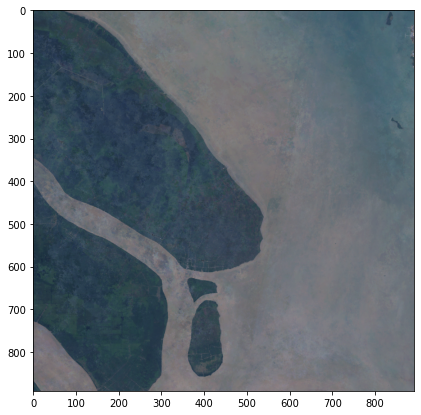

Mask shape: (891, 892, 1)


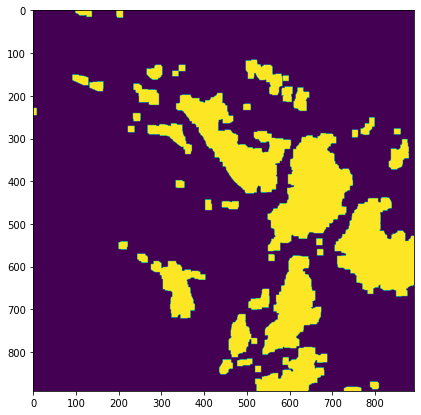

In [5]:
# return list of tfrecords using glob
files = glob.glob(os.path.join(WILDFIRE_SUMATERA_IMAGE_MASK_TFRECORD_PATH, '*.tfrec'), recursive=False)

# shuffled the filse using random sample 
random.seed(SEED)
shuffled_files = random.sample(files, len(files))

# split the shuffled file for train, validation, test
len_dataset = len(shuffled_files)
train_size = math.floor(0.8 * len_dataset)
validation_size = math.ceil(0.1 * len_dataset)
test_size = math.ceil(0.1 * len_dataset)

train_files = shuffled_files[:train_size]
validation_files = shuffled_files[train_size:train_size+validation_size]
test_files = shuffled_files[train_size+validation_size:]

# return a dataset consists of multiple files
parsed_train_dataset = tf.data.TFRecordDataset(train_files).map(parse_tfrecord_fn)
parsed_validation_dataset = tf.data.TFRecordDataset(validation_files).map(parse_tfrecord_fn)
parsed_test_dataset = tf.data.TFRecordDataset(test_files).map(parse_tfrecord_fn)

for image, mask in parsed_train_dataset.take(1):
    print(f"Image shape: {image.shape}")
    plt.figure(figsize=(7, 7))
    plt.imshow(image.numpy()*3)
    plt.show()
    print(f"Mask shape: {mask.shape}")
    plt.figure(figsize=(7, 7))
    plt.imshow(mask.numpy())
    plt.show()

In [6]:
def set_shapes(image, mask, img_shape=(120,120,3)):
    image.set_shape((INPUT_SHAPE))
    mask.set_shape((WIDTH, HEIGHT, 1))
    return image, mask

def normalize_image_mask(image, mask):    
    image = image/255
    mask = mask/255
    return tf.cast(image, tf.dtypes.float32), tf.cast(mask, tf.dtypes.uint8)

def resize_image_mask(image, mask):
    image = tf.image.resize(image, (WIDTH, HEIGHT), method='nearest')
    mask = tf.image.resize(mask, (WIDTH, HEIGHT), method='nearest')
    return image, mask

augmentation = A.Compose([
#     A.Transpose(p=0.5),
#     A.HorizontalFlip(p=0.5),
#     A.VerticalFlip(p=0.5),
    A.ElasticTransform(alpha=1, sigma=100, alpha_affine=100),
    A.GridDistortion(num_steps=20, distort_limit=0.5),
    A.ShiftScaleRotate(shift_limit=[-0.2, 0.2], 
                       scale_limit=[-0.2, 0.2], 
                       rotate_limit=[-90, 90])
])
    
def augment_func(image, mask):
    # resize image and mask
    image, mask = resize_image_mask(image, mask)
    
    # augmentation
    data = {"image": image.numpy(), 'mask': mask.numpy()}
    aug_data = augmentation(**data)
    aug_image, aug_mask = aug_data["image"], aug_data["mask"]
    
    # normalize image and mask
    aug_image, aug_mask = normalize_image_mask(aug_image, aug_mask)
    return aug_image, aug_mask

def process_data(image, mask):
    aug_image, aug_mask = tf.numpy_function(
        func=augment_func, 
        inp=[image, mask],
        Tout=[tf.float32, tf.uint8],
    )
    return aug_image, aug_mask

In [7]:
# get all images and masks
# image augmentation, resizing and normalization on the train dataset
train_dataset = parsed_train_dataset.map(process_data, 
                                         num_parallel_calls=tf.data.experimental.AUTOTUNE).cache()

train_dataset = train_dataset.map(set_shapes, num_parallel_calls=tf.data.experimental.AUTOTUNE).shuffle(1000) \
                .batch(BATCH_SIZE) \
                .prefetch(tf.data.experimental.AUTOTUNE)

# resizing and normalization on the validation dataset
validation_dataset = parsed_validation_dataset.map(resize_image_mask, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache()

validation_dataset = validation_dataset.map(normalize_image_mask, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache()

validation_dataset = validation_dataset.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

# resizing and normalization on the test dataset
test_dataset = parsed_test_dataset.map(resize_image_mask, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache()
test_dataset = test_dataset.map(normalize_image_mask, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache()

test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

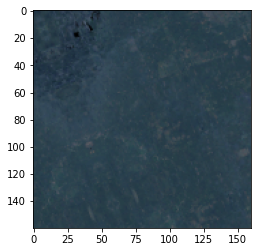

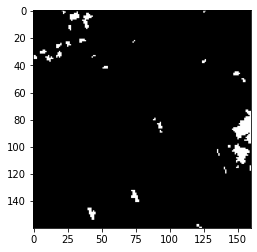

In [8]:
for d in train_dataset.take(1):
    image = d[0][0].numpy()
    mask = d[1][0].numpy()
    plt.imshow(image*3)
    plt.show()
    plt.imshow(mask, cmap='gray')
    plt.show()

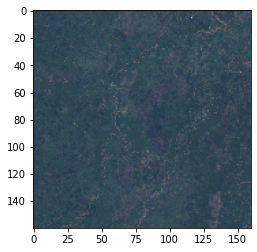

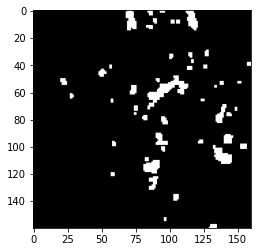

In [9]:
for d in validation_dataset.take(1):
    image = d[0][0].numpy()
    mask = d[1][0].numpy()
    plt.imshow(image*3)
    plt.show()
    plt.imshow(mask, cmap='gray')
    plt.show()

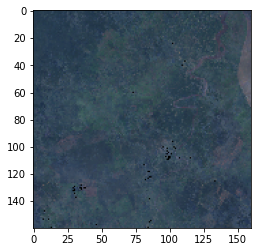

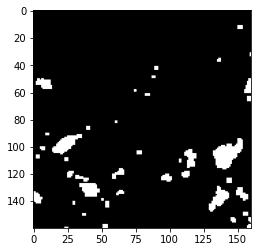

In [10]:
for d in test_dataset.take(1):
    image = d[0][0].numpy()
    mask = d[1][0].numpy()
    plt.imshow(image*3)
    plt.show()
    plt.imshow(mask, cmap='gray')
    plt.show()

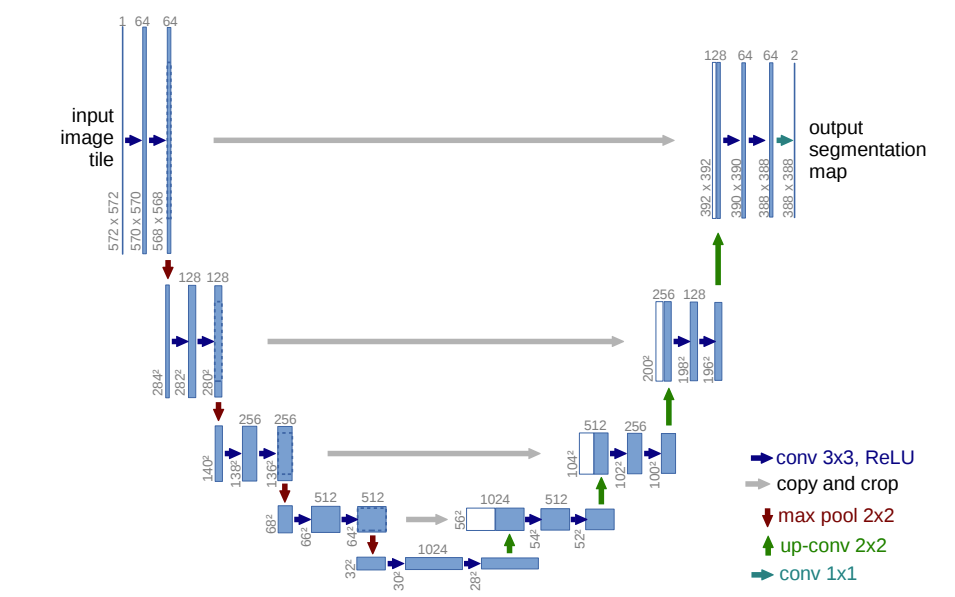

In [31]:
def double_conv_block(x, n_filters):
    x = tf.keras.layers.Conv2D(filters=n_filters, kernel_size=(3, 3), activation=tf.nn.relu,
                               padding='same',kernel_initializer='he_normal')(x)
    x = tf.keras.layers.Conv2D(filters=n_filters, kernel_size=(3, 3), activation=tf.nn.relu,
                               padding='same', kernel_initializer='he_normal')(x)
    return x
    
def downsample_conv_block(x, n_filters):
    c = double_conv_block(x, n_filters)
    p = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(c)
    p = tf.keras.layers.Dropout(0.5)(p)
    return c, p


def upsample_conv_block(x, conv_features, n_filters):
    x = tf.keras.layers.Conv2DTranspose(filters=n_filters,
                                        kernel_size=(3, 3),
                                        strides=(2, 2),
                                        padding='same',)(x)
    x = tf.keras.layers.concatenate([x, conv_features])
    x = tf.keras.layers.Dropout(0.5)(x)
    x = double_conv_block(x, n_filters)
    return x

    
def get_model(input_shape, starting_filter, factor=2):
    # input to the model     
    inputs = tf.keras.layers.Input(shape=input_shape)
    
    # encoder: contracting path - downsample
    # downsample conv block - 1
    c1, p1 = downsample_conv_block(inputs, n_filters=int(starting_filter*math.pow(factor,0)))
    # downsample conv block - 2
    c2, p2 = downsample_conv_block(p1, n_filters=int(starting_filter*math.pow(factor,1)))
    # downsample conv block - 3
    c3, p3 = downsample_conv_block(p2, n_filters=int(starting_filter*math.pow(factor,2)))
    # downsample conv block - 4
    c4, p4 = downsample_conv_block(p3, n_filters=int(starting_filter*math.pow(factor,3)))
    
    # downsample conv block - 5 (Bottleneck)
    bottleneck = double_conv_block(p4, n_filters=int(starting_filter*math.pow(factor,4)))
    
    # decoder: expanding path - upsample
    # upsample conv block - 1
    u1 = upsample_conv_block(bottleneck, c4, n_filters=int(starting_filter*math.pow(factor,3)))
    # upsample conv block - 2
    u2 = upsample_conv_block(u1, c3, n_filters=int(starting_filter*math.pow(factor,2)))
    # upsample conv block - 3
    u3 = upsample_conv_block(u2, c2, n_filters=int(starting_filter*math.pow(factor,1)))
    # upsample conv block - 4
    u4 = upsample_conv_block(u3, c1, n_filters=int(starting_filter*math.pow(factor,0)))
    
    # output
    outputs = tf.keras.layers.Conv2D(filters=1,
                                     kernel_size=(1, 1),
                                     activation='sigmoid')(u4)
    
    unet_model = tf.keras.Model(inputs, outputs, name='unet-model')
    return unet_model

In [32]:
# Create Model
unet_model = get_model(
    input_shape=INPUT_SHAPE,
    starting_filter=16,
)
display(unet_model.summary())

Model: "unet-model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_38 (Conv2D)             (None, 160, 160, 16  448         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_39 (Conv2D)             (None, 160, 160, 16  2320        ['conv2d_38[0][0]']              
                                )                                                        

 nspose)                        )                                                                 
                                                                                                  
 concatenate_11 (Concatenate)   (None, 160, 160, 32  0           ['conv2d_transpose_11[0][0]',    
                                )                                 'conv2d_39[0][0]']              
                                                                                                  
 dropout_23 (Dropout)           (None, 160, 160, 32  0           ['concatenate_11[0][0]']         
                                )                                                                 
                                                                                                  
 conv2d_54 (Conv2D)             (None, 160, 160, 16  4624        ['dropout_23[0][0]']             
                                )                                                                 
          

None

# Limiting GPU memory growth

In [33]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)
        
tf.debugging.set_log_device_placement(True)

1 Physical GPUs, 1 Logical GPU


# Compile and Train U-Net Model

In [34]:
# Compile Model
unet_model.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    metrics=['accuracy']
)

index = len(glob.glob('./best_unet_model*')) + 1

epochs=50
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5, verbose = 2),
    tf.keras.callbacks.ModelCheckpoint(
        filepath = './best_unet_model_{}'.format(index), 
        monitor = 'val_accuracy'.format(index), 
        save_best_only = True,
        mode = 'max', 
        verbose = 2,
    )
]

history = unet_model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=validation_dataset,
    callbacks=callbacks
)

Epoch 1/50
    196/Unknown - 29s 140ms/step - loss: 0.4136 - accuracy: 0.8570
Epoch 1: val_accuracy improved from -inf to 0.86003, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 34s 165ms/step - loss: 0.4136 - accuracy: 0.8570 - val_loss: 0.3964 - val_accuracy: 0.8600
Epoch 2/50
196/196 [==============================] - ETA: 0s - loss: 0.3628 - accuracy: 0.8577
Epoch 2: val_accuracy did not improve from 0.86003
196/196 [==============================] - 29s 145ms/step - loss: 0.3628 - accuracy: 0.8577 - val_loss: 0.3597 - val_accuracy: 0.8600
Epoch 3/50
196/196 [==============================] - ETA: 0s - loss: 0.3420 - accuracy: 0.8588
Epoch 3: val_accuracy improved from 0.86003 to 0.87348, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 32s 164ms/step - loss: 0.3420 - accuracy: 0.8588 - val_loss: 0.3168 - val_accuracy: 0.8735
Epoch 4/50
196/196 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8733
Epoch 4: val_accuracy improved from 0.87348 to 0.89152, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 32s 164ms/step - loss: 0.3236 - accuracy: 0.8733 - val_loss: 0.2826 - val_accuracy: 0.8915
Epoch 5/50
196/196 [==============================] - ETA: 0s - loss: 0.3104 - accuracy: 0.8789
Epoch 5: val_accuracy improved from 0.89152 to 0.89215, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 166ms/step - loss: 0.3104 - accuracy: 0.8789 - val_loss: 0.2843 - val_accuracy: 0.8921
Epoch 6/50
196/196 [==============================] - ETA: 0s - loss: 0.3040 - accuracy: 0.8812
Epoch 6: val_accuracy improved from 0.89215 to 0.89493, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 166ms/step - loss: 0.3040 - accuracy: 0.8812 - val_loss: 0.2648 - val_accuracy: 0.8949
Epoch 7/50
196/196 [==============================] - ETA: 0s - loss: 0.3007 - accuracy: 0.8824
Epoch 7: val_accuracy did not improve from 0.89493
196/196 [==============================] - 29s 146ms/step - loss: 0.3007 - accuracy: 0.8824 - val_loss: 0.2701 - val_accuracy: 0.8945
Epoch 8/50
196/196 [==============================] - ETA: 0s - loss: 0.2933 - accuracy: 0.8850
Epoch 8: val_accuracy did not improve from 0.89493
196/196 [==============================] - 29s 147ms/step - loss: 0.2933 - accuracy: 0.8850 - val_loss: 0.2936 - val_accuracy: 0.8928
Epoch 9/50
196/196 [==============================] - ETA: 0s - loss: 0.2920 - accuracy: 0.8855
Epoch 9: val_accuracy improved from 0.89493 to 0.89786, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 32s 166ms/step - loss: 0.2920 - accuracy: 0.8855 - val_loss: 0.2634 - val_accuracy: 0.8979
Epoch 10/50
196/196 [==============================] - ETA: 0s - loss: 0.2862 - accuracy: 0.8879
Epoch 10: val_accuracy improved from 0.89786 to 0.90311, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 167ms/step - loss: 0.2862 - accuracy: 0.8879 - val_loss: 0.2471 - val_accuracy: 0.9031
Epoch 11/50
196/196 [==============================] - ETA: 0s - loss: 0.2815 - accuracy: 0.8899
Epoch 11: val_accuracy did not improve from 0.90311
196/196 [==============================] - 29s 147ms/step - loss: 0.2815 - accuracy: 0.8899 - val_loss: 0.2603 - val_accuracy: 0.9017
Epoch 12/50
196/196 [==============================] - ETA: 0s - loss: 0.2829 - accuracy: 0.8894
Epoch 12: val_accuracy did not improve from 0.90311
196/196 [==============================] - 29s 148ms/step - loss: 0.2829 - accuracy: 0.8894 - val_loss: 0.2687 - val_accuracy: 0.8964
Epoch 13/50
196/196 [==============================] - ETA: 0s - loss: 0.2781 - accuracy: 0.8914
Epoch 13: val_accuracy improved from 0.90311 to 0.90411, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 168ms/step - loss: 0.2781 - accuracy: 0.8914 - val_loss: 0.2463 - val_accuracy: 0.9041
Epoch 14/50
196/196 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8928
Epoch 14: val_accuracy improved from 0.90411 to 0.90454, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 168ms/step - loss: 0.2760 - accuracy: 0.8928 - val_loss: 0.2442 - val_accuracy: 0.9045
Epoch 15/50
196/196 [==============================] - ETA: 0s - loss: 0.2710 - accuracy: 0.8944
Epoch 15: val_accuracy did not improve from 0.90454
196/196 [==============================] - 29s 149ms/step - loss: 0.2710 - accuracy: 0.8944 - val_loss: 0.2636 - val_accuracy: 0.8988
Epoch 16/50
196/196 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.8945
Epoch 16: val_accuracy improved from 0.90454 to 0.91097, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 168ms/step - loss: 0.2703 - accuracy: 0.8945 - val_loss: 0.2276 - val_accuracy: 0.9110
Epoch 17/50
196/196 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8958
Epoch 17: val_accuracy did not improve from 0.91097
196/196 [==============================] - 29s 148ms/step - loss: 0.2677 - accuracy: 0.8958 - val_loss: 0.2466 - val_accuracy: 0.9072
Epoch 18/50
196/196 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.8966
Epoch 18: val_accuracy did not improve from 0.91097
196/196 [==============================] - 29s 150ms/step - loss: 0.2659 - accuracy: 0.8966 - val_loss: 0.2404 - val_accuracy: 0.9081
Epoch 19/50
196/196 [==============================] - ETA: 0s - loss: 0.2663 - accuracy: 0.8961
Epoch 19: val_accuracy improved from 0.91097 to 0.91295, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 169ms/step - loss: 0.2663 - accuracy: 0.8961 - val_loss: 0.2249 - val_accuracy: 0.9129
Epoch 20/50
196/196 [==============================] - ETA: 0s - loss: 0.2600 - accuracy: 0.8990
Epoch 20: val_accuracy improved from 0.91295 to 0.91392, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 168ms/step - loss: 0.2600 - accuracy: 0.8990 - val_loss: 0.2196 - val_accuracy: 0.9139
Epoch 21/50
196/196 [==============================] - ETA: 0s - loss: 0.2587 - accuracy: 0.8993
Epoch 21: val_accuracy improved from 0.91392 to 0.91425, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 35s 177ms/step - loss: 0.2587 - accuracy: 0.8993 - val_loss: 0.2219 - val_accuracy: 0.9143
Epoch 22/50
196/196 [==============================] - ETA: 0s - loss: 0.2572 - accuracy: 0.8997
Epoch 22: val_accuracy improved from 0.91425 to 0.91557, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 36s 182ms/step - loss: 0.2572 - accuracy: 0.8997 - val_loss: 0.2194 - val_accuracy: 0.9156
Epoch 23/50
196/196 [==============================] - ETA: 0s - loss: 0.2559 - accuracy: 0.9003
Epoch 23: val_accuracy improved from 0.91557 to 0.91580, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 35s 175ms/step - loss: 0.2559 - accuracy: 0.9003 - val_loss: 0.2165 - val_accuracy: 0.9158
Epoch 24/50
196/196 [==============================] - ETA: 0s - loss: 0.2530 - accuracy: 0.9016
Epoch 24: val_accuracy improved from 0.91580 to 0.91703, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 34s 174ms/step - loss: 0.2530 - accuracy: 0.9016 - val_loss: 0.2143 - val_accuracy: 0.9170
Epoch 25/50
196/196 [==============================] - ETA: 0s - loss: 0.2522 - accuracy: 0.9019
Epoch 25: val_accuracy improved from 0.91703 to 0.91861, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 168ms/step - loss: 0.2522 - accuracy: 0.9019 - val_loss: 0.2083 - val_accuracy: 0.9186
Epoch 26/50
196/196 [==============================] - ETA: 0s - loss: 0.2496 - accuracy: 0.9029
Epoch 26: val_accuracy improved from 0.91861 to 0.91879, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 33s 168ms/step - loss: 0.2496 - accuracy: 0.9029 - val_loss: 0.2088 - val_accuracy: 0.9188
Epoch 27/50
196/196 [==============================] - ETA: 0s - loss: 0.2491 - accuracy: 0.9031
Epoch 27: val_accuracy improved from 0.91879 to 0.91890, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 44s 224ms/step - loss: 0.2491 - accuracy: 0.9031 - val_loss: 0.2089 - val_accuracy: 0.9189
Epoch 28/50
196/196 [==============================] - ETA: 0s - loss: 0.2459 - accuracy: 0.9041
Epoch 28: val_accuracy did not improve from 0.91890
196/196 [==============================] - 30s 154ms/step - loss: 0.2459 - accuracy: 0.9041 - val_loss: 0.2118 - val_accuracy: 0.9175
Epoch 29/50
196/196 [==============================] - ETA: 0s - loss: 0.2455 - accuracy: 0.9043
Epoch 29: val_accuracy did not improve from 0.91890
196/196 [==============================] - 30s 152ms/step - loss: 0.2455 - accuracy: 0.9043 - val_loss: 0.2097 - val_accuracy: 0.9186
Epoch 30/50
196/196 [==============================] - ETA: 0s - loss: 0.2460 - accuracy: 0.9039
Epoch 30: val_accuracy improved from 0.91890 to 0.92122, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 36s 184ms/step - loss: 0.2460 - accuracy: 0.9039 - val_loss: 0.2021 - val_accuracy: 0.9212
Epoch 31/50
196/196 [==============================] - ETA: 0s - loss: 0.2434 - accuracy: 0.9052
Epoch 31: val_accuracy did not improve from 0.92122
196/196 [==============================] - 30s 153ms/step - loss: 0.2434 - accuracy: 0.9052 - val_loss: 0.2047 - val_accuracy: 0.9206
Epoch 32/50
196/196 [==============================] - ETA: 0s - loss: 0.2400 - accuracy: 0.9065
Epoch 32: val_accuracy improved from 0.92122 to 0.92210, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 36s 181ms/step - loss: 0.2400 - accuracy: 0.9065 - val_loss: 0.2013 - val_accuracy: 0.9221
Epoch 33/50
196/196 [==============================] - ETA: 0s - loss: 0.2400 - accuracy: 0.9065
Epoch 33: val_accuracy did not improve from 0.92210
196/196 [==============================] - 30s 154ms/step - loss: 0.2400 - accuracy: 0.9065 - val_loss: 0.2054 - val_accuracy: 0.9204
Epoch 34/50
196/196 [==============================] - ETA: 0s - loss: 0.2381 - accuracy: 0.9073
Epoch 34: val_accuracy improved from 0.92210 to 0.92294, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 36s 185ms/step - loss: 0.2381 - accuracy: 0.9073 - val_loss: 0.1986 - val_accuracy: 0.9229
Epoch 35/50
196/196 [==============================] - ETA: 0s - loss: 0.2373 - accuracy: 0.9075
Epoch 35: val_accuracy did not improve from 0.92294
196/196 [==============================] - 30s 151ms/step - loss: 0.2373 - accuracy: 0.9075 - val_loss: 0.2084 - val_accuracy: 0.9188
Epoch 36/50
196/196 [==============================] - ETA: 0s - loss: 0.2355 - accuracy: 0.9083
Epoch 36: val_accuracy improved from 0.92294 to 0.92381, saving model to .\best_unet_model_9


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 34s 171ms/step - loss: 0.2355 - accuracy: 0.9083 - val_loss: 0.1988 - val_accuracy: 0.9238
Epoch 37/50
196/196 [==============================] - ETA: 0s - loss: 0.2353 - accuracy: 0.9084
Epoch 37: val_accuracy did not improve from 0.92381
196/196 [==============================] - 29s 149ms/step - loss: 0.2353 - accuracy: 0.9084 - val_loss: 0.2004 - val_accuracy: 0.9223
Epoch 38/50
196/196 [==============================] - ETA: 0s - loss: 0.2338 - accuracy: 0.9090
Epoch 38: val_accuracy did not improve from 0.92381
196/196 [==============================] - 29s 150ms/step - loss: 0.2338 - accuracy: 0.9090 - val_loss: 0.2072 - val_accuracy: 0.9192
Epoch 39/50
196/196 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9096
Epoch 39: val_accuracy did not improve from 0.92381
196/196 [==============================] - 30s 151ms/step - loss: 0.2324 - accuracy: 0.9096 - val_loss: 0.1986 - val_accuracy: 0.9229
Epoch 40/50
196/1

INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


INFO:tensorflow:Assets written to: .\best_unet_model_9\assets


196/196 [==============================] - 35s 179ms/step - loss: 0.2260 - accuracy: 0.9122 - val_loss: 0.1960 - val_accuracy: 0.9249
Epoch 46/50
196/196 [==============================] - ETA: 0s - loss: 0.2240 - accuracy: 0.9129
Epoch 46: val_accuracy did not improve from 0.92488
196/196 [==============================] - 30s 153ms/step - loss: 0.2240 - accuracy: 0.9129 - val_loss: 0.2086 - val_accuracy: 0.9195
Epoch 47/50
196/196 [==============================] - ETA: 0s - loss: 0.2244 - accuracy: 0.9127
Epoch 47: val_accuracy did not improve from 0.92488
196/196 [==============================] - 30s 152ms/step - loss: 0.2244 - accuracy: 0.9127 - val_loss: 0.2129 - val_accuracy: 0.9187
Epoch 48/50
196/196 [==============================] - ETA: 0s - loss: 0.2242 - accuracy: 0.9129
Epoch 48: val_accuracy did not improve from 0.92488
196/196 [==============================] - 30s 152ms/step - loss: 0.2242 - accuracy: 0.9129 - val_loss: 0.2101 - val_accuracy: 0.9186
Epoch 49/50
196/1

In [35]:
def evaluate_model(history):
    plt.figure(figsize=(10, 15))
    plt.subplot(211)
    plt.title('Accuracy vs Validation Accuracy')
    plt.plot(history.history['accuracy'], label='train accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.legend()
    plt.show()
    
    plt.figure(figsize=(10, 15))
    plt.subplot(212)
    plt.title('Loss vs Validation Loss')
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.legend()
    plt.show()

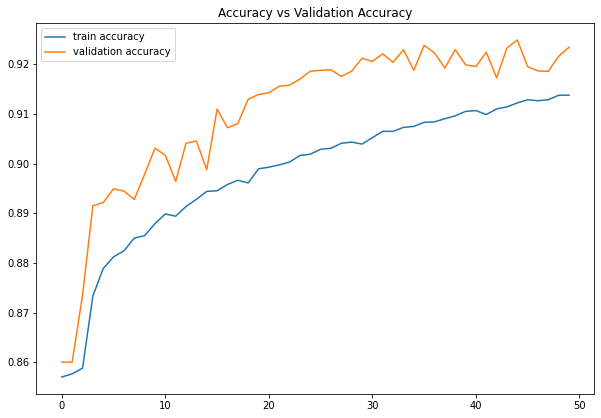

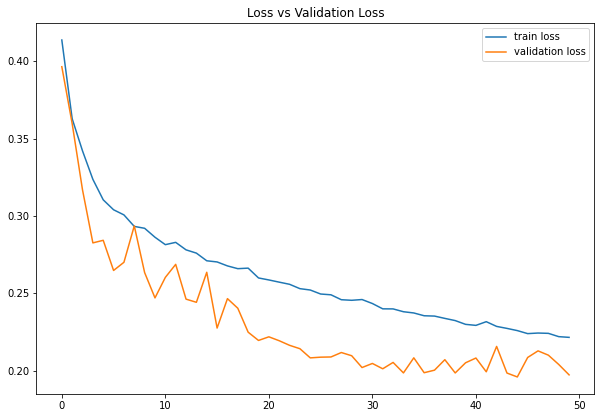

In [36]:
evaluate_model(history)

In [37]:
result = unet_model.predict(test_dataset)

25/25 [==============================] - 1s 46ms/step


In [38]:
np_result = np.array(result)
# for i, res in enumerate(np_result):
np_result = np.where(np_result<0.5, 0, 1)

In [39]:
def display_image_prediction(dataset, result_mask):
    for batch in dataset.take(1):
        n_rows = len(batch[0])
        n_cols = 3
        i = 0
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows*10), sharey=True)
        for image, true_mask in zip(batch[0], batch[1]):
            image = tf.cast(image*255, tf.uint8)
            true_mask = tf.cast(true_mask*255, tf.uint8)
            predicted_mask = result_mask[i]
            axs[i, 0].imshow(image.numpy()*3)
            axs[i, 0].set_title('Image')
            axs[i, 1].imshow(true_mask.numpy())
            axs[i, 1].set_title('True Mask')
            axs[i, 2].imshow(predicted_mask)
            axs[i, 2].set_title('Predicted Mask')
            i+=1
        plt.show()

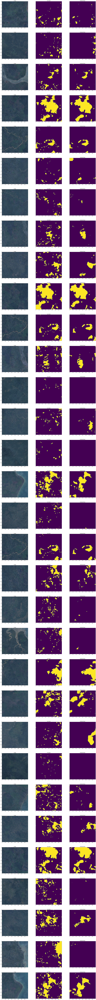

In [40]:
display_image_prediction(test_dataset, np_result)